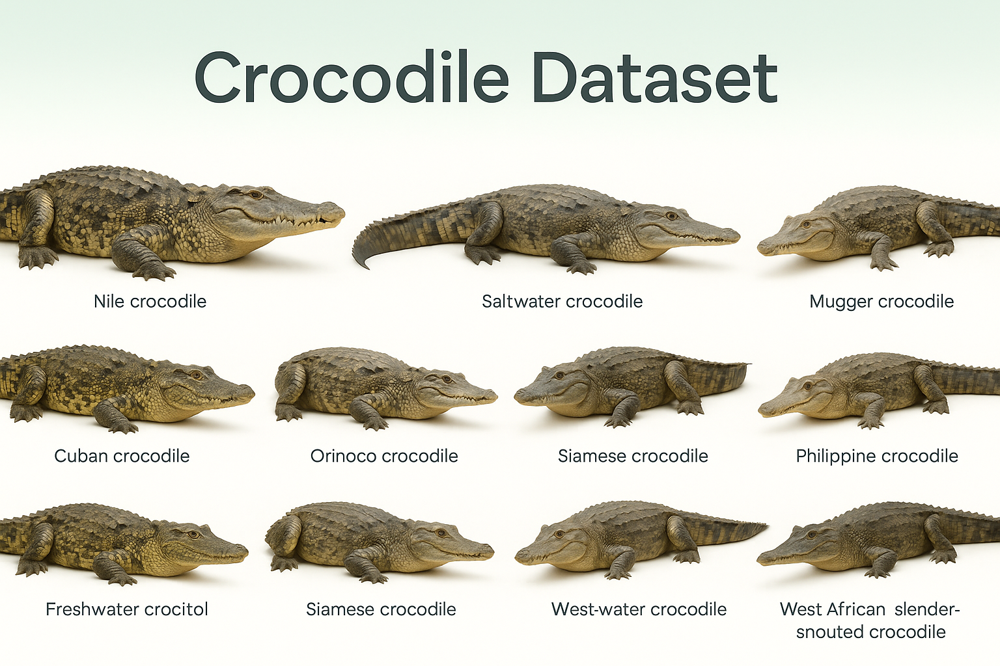

In [1]:
import pandas as pd
df = pd.read_csv("/content/crocodile_dataset.csv")
df.head()
df.shape, df.dtypes


((1000, 15),
 Observation ID            int64
 Common Name              object
 Scientific Name          object
 Family                   object
 Genus                    object
 Observed Length (m)     float64
 Observed Weight (kg)    float64
 Age Class                object
 Sex                      object
 Date of Observation      object
 Country/Region           object
 Habitat Type             object
 Conservation Status      object
 Observer Name            object
 Notes                    object
 dtype: object)

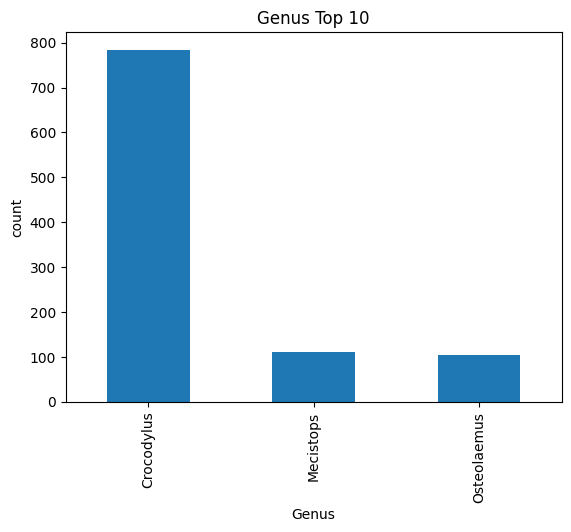

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

col = "Genus"  # 実在する列名に変えてOK
top = df[col].value_counts().head(10)

top.plot(kind="bar")
plt.title(f"{col} Top 10")
plt.xlabel(col); plt.ylabel("count")
plt.show()


In [3]:
df.head()

,Observation ID,Common Name,Scientific Name,Family,Genus,Observed Length (m),Observed Weight (kg),Age Class,Sex,Date of Observation,Country/Region,Habitat Type,Conservation Status,Observer Name,Notes
0,1,Morelet's Crocodile,Crocodylus moreletii,Crocodylidae,Crocodylus,1.90,62.0,Adult,Male,31-03-2018,Belize,Swamps,Least Concern,Allison Hill,Cause bill scientist nation opportunity.
1,2,American Crocodile,Crocodylus acutus,Crocodylidae,Crocodylus,4.09,334.5,Adult,Male,28-01-2015,Venezuela,Mangroves,Vulnerable,Brandon Hall,Ago current practice nation determine operatio...
2,3,Orinoco Crocodile,Crocodylus intermedius,Crocodylidae,Crocodylus,1.08,118.2,Juvenile,Unknown,07-12-2010,Venezuela,Flooded Savannas,Critically Endangered,Melissa Peterson,Democratic shake bill here grow gas enough ana...
3,4,Morelet's Crocodile,Crocodylus moreletii,Crocodylidae,Crocodylus,2.42,90.4,Adult,Male,01-11-2019,Mexico,Rivers,Least Concern,Edward Fuller,Officer relate animal direction eye bag do.
4,5,Mugger Crocodile (Marsh Crocodile),Crocodylus palustris,Crocodylidae,Crocodylus,3.75,269.4,Adult,Unknown,15-07-2019,India,Rivers,Vulnerable,Donald Reid,Class great prove reduce raise author play mov...


Common Name
New Guinea Crocodile                         68
Borneo Crocodile (disputed)                  67
American Crocodile                           66
Morelet's Crocodile                          64
Cuban Crocodile                              59
Orinoco Crocodile                            58
Philippine Crocodile                         58
Saltwater Crocodile                          58
West African Dwarf Crocodile                 57
Central African Slender-snouted Crocodile    56
Name: count, dtype: int64


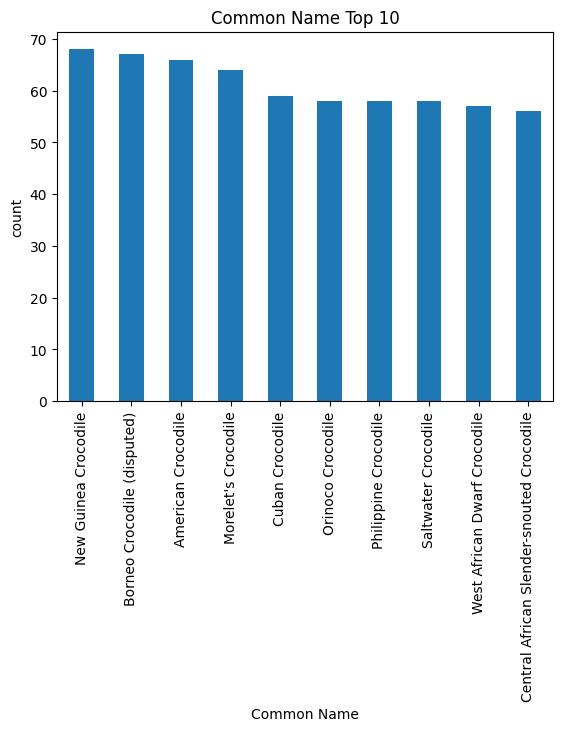

In [5]:
col = "Common Name"
top = df[col].value_counts().head(10)
print(top)

top.plot(kind="bar")
plt.title(f"{col} Top 10")
plt.xlabel(col); plt.ylabel("count")
plt.show()

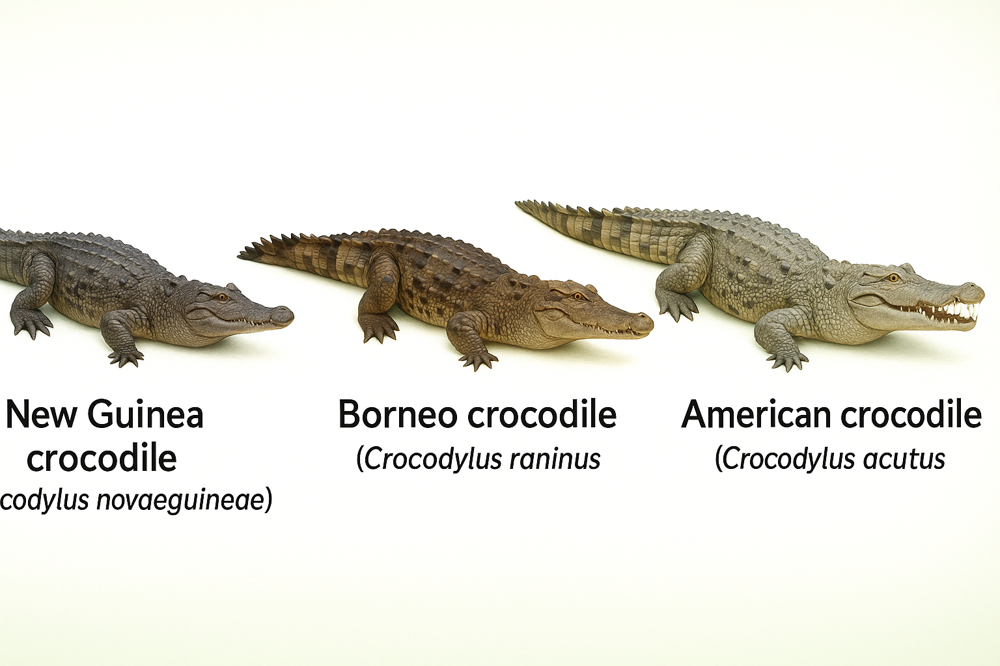

Habitat Type
Rivers                 165
Swamps                 156
Forest Swamps           57
Lakes                   54
Freshwater Wetlands     47
Estuarine Systems       37
Estuaries               34
Mangroves               32
Flooded Savannas        31
Forest Rivers           30
Name: count, dtype: int64


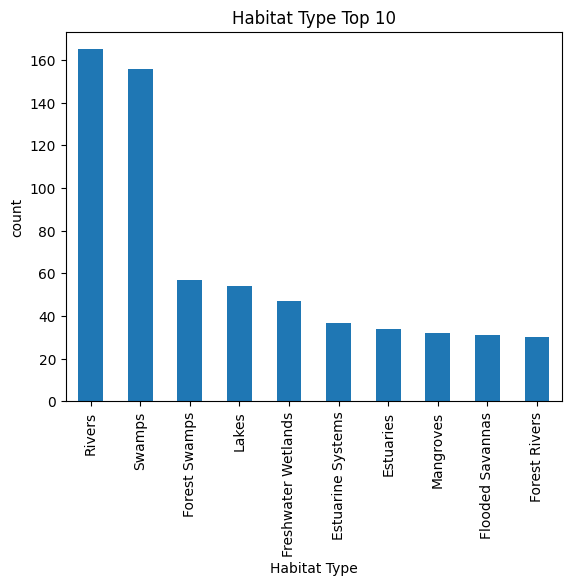

In [7]:
col = "Habitat Type"
top = df[col].value_counts().head(10)
print(top)

top.plot(kind="bar")
plt.title(f"{col} Top 10")
plt.xlabel(col); plt.ylabel("count")
plt.show()

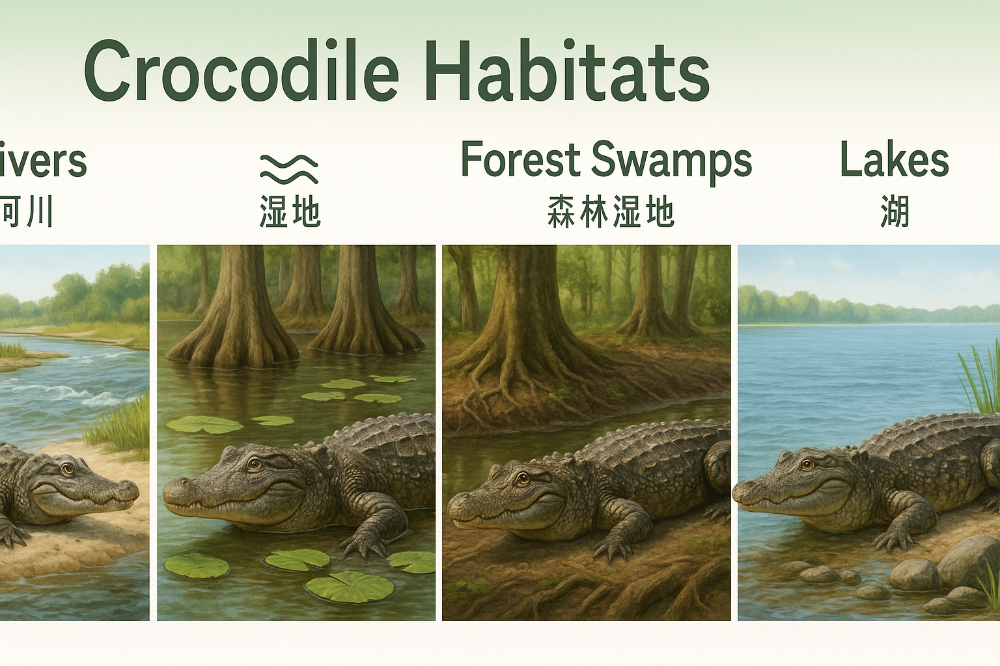

In [13]:
import plotly.express as px

cnt_world = df_c['_country'].value_counts().reset_index()
cnt_world.columns = ['country','count']
px.choropleth(cnt_world, locations='country', locationmode='country names',
              color='count', title='Global: Count by Country').show()




In [14]:
# Country/Region を分解→正規化→対象国に絞って「Genus×国」カウント
import pandas as pd
import plotly.express as px

# 1) 国名を分解・展開
_c = (df['Country/Region'].fillna('').astype(str)
      .str.replace(r'\s*\(.*?\)', '', regex=True)   # 括弧内注記を削除
      .str.replace('[&/;]', ',', regex=True)        # 区切りをカンマに寄せる
      .str.split(','))
tmp = df.assign(_country_list=_c).explode('_country_list')
tmp['_country'] = tmp['_country_list'].str.strip()

# 2) 軽い正規化（表記ゆれ吸収）
tmp['_country_norm'] = (tmp['_country']
                        .str.replace(r'\s+', ' ', regex=True)
                        .str.strip()
                        .str.title())

alias = {
    'Viet Nam':'Vietnam',
    'Philippine':'Philippines',
    'China Prc':'China',
    'People\'s Republic Of China':'China',
    'Mainland China':'China',
    'Republic Of China':'Taiwan',
    'Taiwan, China':'Taiwan',
}
tmp['_country_norm'] = tmp['_country_norm'].replace(alias)

# 3) 対象国で集計 → ピボット → ヒートマップ
targets = ['China','Taiwan','Philippines','Vietnam']
sub = tmp[tmp['_country_norm'].isin(targets)]

pv = (sub.groupby(['Genus','_country_norm'])
          .size().reset_index(name='n')
          .pivot(index='Genus', columns='_country_norm', values='n')
          .fillna(0).astype(int))

# 行の合計で並べ替えて見やすく
pv = pv.loc[pv.sum(axis=1).sort_values(ascending=False).index]

if pv.size == 0:
    print("該当データがありません（国名の表記ゆれが強いか、そもそも記録がない可能性）。")
else:
    px.imshow(pv, text_auto=True, aspect='auto',
              title='Genus × Country（China / Taiwan / Philippines / Vietnam）').show()


In [15]:
import pandas as pd

# Country/Region を分割して1国1行に展開
_c = (df['Country/Region'].fillna('').astype(str)
      .str.replace(r'\s*\(.*?\)', '', regex=True)   # 括弧内注記を除去
      .str.replace('[&/;]', ',', regex=True)        # 区切りをカンマに揃える
      .str.split(','))

dfe = df.assign(_country_list=_c).explode('_country_list')
dfe['_country'] = dfe['_country_list'].str.strip()

# 表記ゆれを軽く正規化
dfe['_country_norm'] = (dfe['_country']
                        .str.replace(r'\s+', ' ', regex=True)
                        .str.strip().str.title())

alias = {
    'Viet Nam':'Vietnam',
    'Philippine':'Philippines',
    'Republic Of Vietnam':'Vietnam',
    'Socialist Republic Of Vietnam':'Vietnam',
    'Taiwan, Province Of China':'Taiwan',  # 念のため
}
dfe['_country_norm'] = dfe['_country_norm'].replace(alias)


In [16]:
targets = ['Philippines', 'Vietnam']
sub = dfe[dfe['_country_norm'].isin(targets)].copy()

# Common Name を軽く整形（空白のみ揃える。表記は維持）
sub['Common Name'] = sub['Common Name'].astype(str).str.strip()

rank_by_country = (sub.groupby(['_country_norm','Common Name'])
                     .size().reset_index(name='count')
                     .sort_values(['_country_norm','count'], ascending=[True, False]))

# 国ごとに表示（上位20件）
for c in targets:
    print(f'==== {c}: Common Name ranking ====')
    display(rank_by_country[rank_by_country['_country_norm']==c]
            .head(20)[['Common Name','count']])


==== Philippines: Common Name ranking ====


,Common Name,count
0,Philippine Crocodile,58
1,Saltwater Crocodile,10


==== Vietnam: Common Name ranking ====


,Common Name,count
2,Siamese Crocodile,11


In [18]:
pivot = (rank_by_country
         .pivot(index='Common Name', columns='_country_norm', values='count')
         .fillna(0).astype(int)
         .sort_values(by=targets, ascending=False))

display(pivot.head(30))  # 上位30行



_country_norm,Philippines,Vietnam
Common Name,,
Philippine Crocodile,58,0
Saltwater Crocodile,10,0
Siamese Crocodile,0,11


In [19]:
import plotly.express as px

for c in targets:
    top = (rank_by_country[rank_by_country['_country_norm']==c]
           .head(15))  # 上位15
    fig = px.bar(top, x='Common Name', y='count',
                 title=f'{c}: Common Name Top',
                 labels={'count':'count'})
    fig.update_layout(xaxis={'categoryorder':'total descending'})
    fig.show()


In [23]:
import pandas as pd
import plotly.express as px

# 1) 成体だけに絞る（未成体が混ざると平均が下がるため）
USE_ADULT_ONLY = True
data = df.copy()
if USE_ADULT_ONLY and 'Age Class' in data.columns:
    data = data[data['Age Class'].astype(str).str.contains('Adult', case=False, na=False)]

# 2) 体長が欠損でない行だけ
data = data[pd.to_numeric(data['Observed Length (m)'], errors='coerce').notna()].copy()
data['Observed Length (m)'] = pd.to_numeric(data['Observed Length (m)'], errors='coerce')

# 3) Common Nameごとに集計（件数も付けて信頼度を見える化）
rank_len = (data.assign(**{'Common Name': data['Common Name'].astype(str).str.strip()})
                 .groupby('Common Name', as_index=False)
                 .agg(n=('Observed Length (m)','count'),
                      mean_length_m=('Observed Length (m)','mean'),
                      median_length_m=('Observed Length (m)','median'))
                 .sort_values('mean_length_m', ascending=False))

# 5) グラフ（上位15）
topN = rank_len.head(15)
print(topN)
fig = px.bar(topN, x='Common Name', y='mean_length_m',
             title='Average Length (m) by Common Name (Adult only)',
             labels={'mean_length_m':'Avg length (m)'})
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()


                                  Common Name   n  mean_length_m  \
13                        Saltwater Crocodile  48       4.762292   
10                             Nile Crocodile  38       4.045526   
11                          Orinoco Crocodile  38       3.760000   
0                          American Crocodile  48       3.399583   
8          Mugger Crocodile (Marsh Crocodile)  37       3.185946   
1                 Borneo Crocodile (disputed)  50       2.876800   
6                 Hall's New Guinea Crocodile  35       2.849429   
17     West African Slender-snouted Crocodile  45       2.738000   
14                          Siamese Crocodile  32       2.641563   
15                     West African Crocodile  40       2.623250   
4                             Cuban Crocodile  45       2.618000   
9                        New Guinea Crocodile  47       2.525745   
2   Central African Slender-snouted Crocodile  39       2.446923   
7                         Morelet's Crocodile  5

4m!!!!! SOoooooo Huge!!!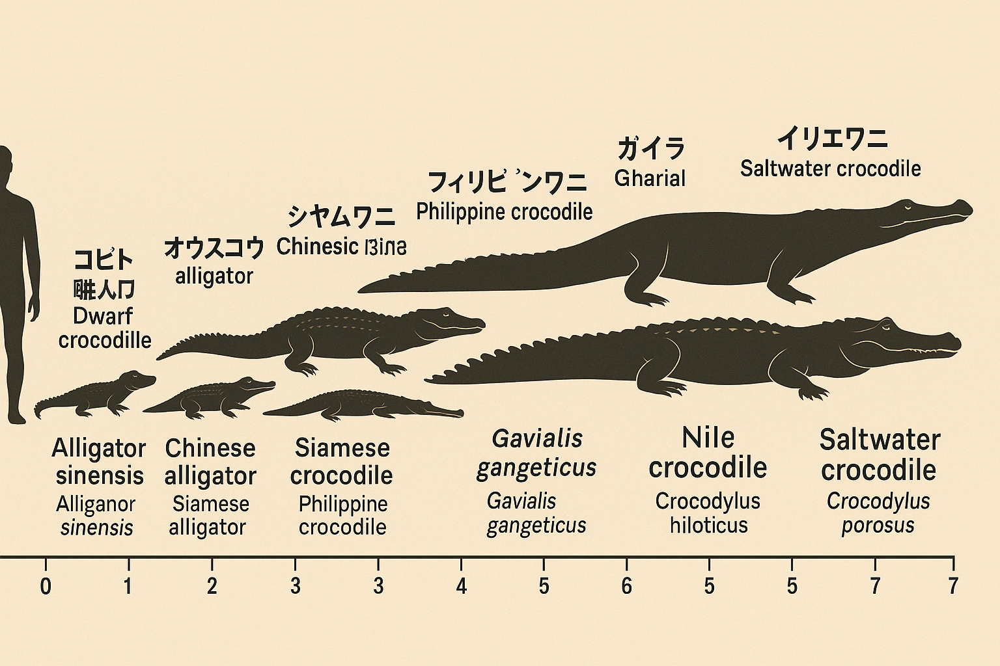

In [26]:
import pandas as pd, numpy as np
import plotly.express as px

# 設定（必要なら調整）
USE_ADULT_ONLY = True   # 未成体を含めたいなら False
MIN_N = 3               # 1種あたり最低サンプル数
LEN_MIN, LEN_MAX = 0.3, 7.0  # 現実的な体長レンジ(メートル)

data = df.copy()
data['Observed Length (m)'] = pd.to_numeric(data['Observed Length (m)'], errors='coerce')
if USE_ADULT_ONLY and 'Age Class' in data.columns:
    data = data[data['Age Class'].astype(str).str.contains('Adult', case=False, na=False)]

# あり得ない値を除外 & Common Name整形
data = data[data['Observed Length (m)'].between(LEN_MIN, LEN_MAX)]
data['Common Name'] = data['Common Name'].astype(str).str.strip()

# 集計（平均・中央値・件数・95%CI）
g = (data.groupby('Common Name')['Observed Length (m)']
        .agg(count='count', mean='mean', median='median', std='std')
        .reset_index())
g = g[g['count'] >= MIN_N].copy()
g['ci95'] = 1.96 * g['std'] / np.sqrt(g['count'])

# 小さい順ランキング
small = g.sort_values('mean', ascending=True)
display(small.head(20))  # 小さい順トップ20を表で確認

# 横棒グラフ（小さい順トップ15）
topN = small.head(15)
fig = px.bar(topN, x='mean', y='Common Name', orientation='h',
             error_x='ci95',
             title='Smallest species by average length (Adults, n≥3)',
             labels={'mean':'Avg length (m)'})
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()




,Common Name,count,mean,median,std,ci95
16,West African Dwarf Crocodile,47,1.235319,1.240,0.202161,0.057797
3,Congo Dwarf Crocodile,39,1.384359,1.400,0.181642,0.057008
12,Philippine Crocodile,48,1.998542,2.025,0.279970,0.079204
5,Freshwater Crocodile (Johnstone's),29,2.246207,2.170,0.308654,0.112339
7,Morelet's Crocodile,52,2.445962,2.465,0.413916,0.112504
2,Central African Slender-snouted Crocodile,39,2.446923,2.500,0.314468,0.098696
9,New Guinea Crocodile,47,2.525745,2.500,0.312234,0.089266
4,Cuban Crocodile,45,2.618000,2.630,0.348357,0.101783
15,West African Crocodile,40,2.623250,2.665,0.326327,0.101130
14,Siamese Crocodile,32,2.641563,2.725,0.347295,0.120331


- Ranks crocodilian **Common Names** by average observed length (**adults only**).
- QC: drop implausible values, and require **n ≥ 3** per name.
- **~4 m is truly large**—only the biggest taxa approach it; most are well below.
- Even “small” species typically exceed **~1 m** as adults.
- Coverage is incomplete: several **rarer Asian taxa are missing/under-sampled**—interpret accordingly.
